In [32]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
import random 

# Simulation

### Linear Networks

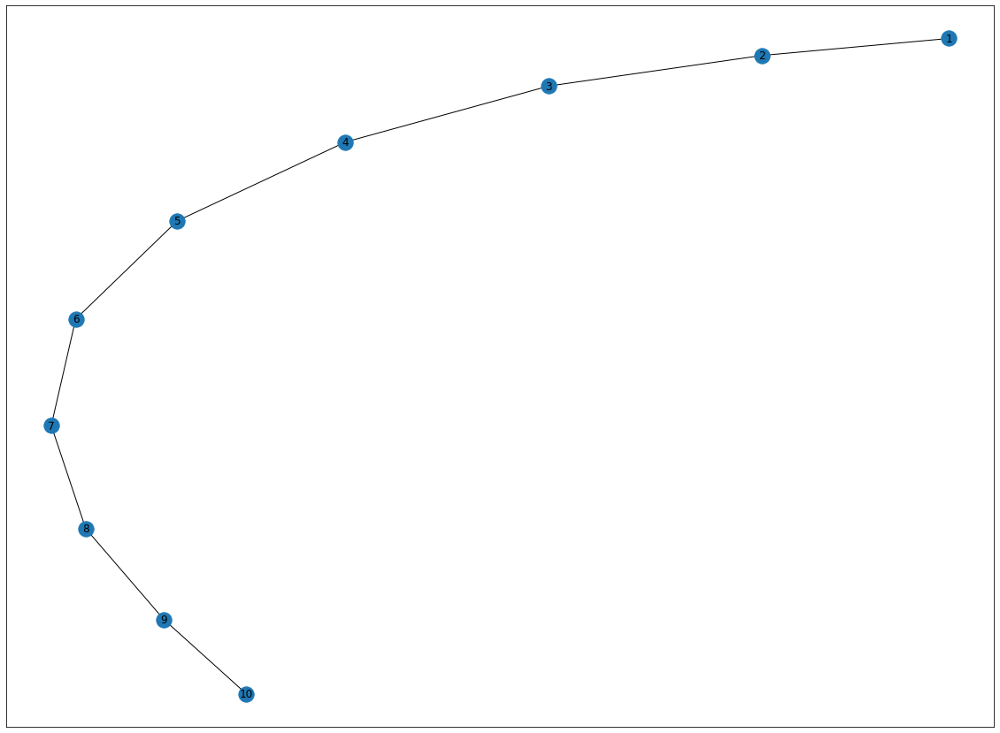

In [33]:
# Initialize network of n players with e edges
def start(n):
    G = nx.Graph()
    players=(np.arange(1,n+1)) # n players
    G.add_nodes_from(set(players))
    # initializing a newtork of n small firms
    i = 1
    while i < n:
        u = i
        v = i+1
        G.add_edge(u, v)
        i+=1
    return G
G=start(10)
plt.rcParams["figure.figsize"] = (20,15)
nx.draw_networkx(G)

### Game Setup

In [34]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [113]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




### T-period repeated game

In [35]:
def game(G,x,a,b,T,p,sigma,s):
    
    # time t
    # x incumbent's strategy
    # a is payoff when entrant stays out
    # b
    # p is entrant's belief threshold
    # s list of small players
    
    u_big_player = []
    u_small_player = []
    
    n=len(G.nodes)
    t=0
    
    opplay=[]
    
    while t<T:
        
        if G.nodes[s[t]]['belief'][t]>p:
            small_play='O'
       
        else:
            small_play='I'
            
            

        if small_play=='O':
            u_b=a
            u_s=0
            stageo(G,s[t])
        
        big_play=x[t]
        
        
        if t==T:
            big_play='A'

            
        if small_play=='I' and big_play=='F':
            u_b=-1
            u_s=b-1
            stagef(G,s[t])
            
            
        elif small_play=='I' and big_play=='A':
            u_b=0
            u_s=b
            stagea(G,s[t])
            
        opplay.append(small_play)
        u_big_player+=[u_b*sigma**t]
        u_small_player+=[u_s*sigma**t]
        
        t+=1
         
    return u_big_player, opplay



In [36]:
# Assign prior beliefs as attribute
def initial_beliefs(p,G):
    for i in G.nodes:
        G.nodes[i]['belief'] = [p]


## Simulations on Linear Network

## changing number of nodes

### f() = 1/x

In [116]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

In [117]:
# Payoff values
a=2
b=0.5

In [66]:
payoffs1=[]
j=0
G=start(5)
T=5
s=(np.arange(1,6)).tolist()
while j < len(G.nodes)+1:
    G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs1.append(outcome)
    j+=1

In [67]:
payoffs1

[0, 3, 3, 3, 4, 4]

In [68]:
payoffs2=[]
j=0
G=start(20)
T=20
s=(np.arange(1,21)).tolist()
while j < len(G.nodes)+1:
    G=start(20)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs2.append(outcome)
    j+=1

In [110]:
payoffs2

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 28,
 28,
 28,
 28,
 28,
 28]

In [70]:
payoffs3=[]
j=0
G=start(150)
T=150
s=(np.arange(1,151)).tolist()
while j < len(G.nodes)+1:
    G=start(150)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs3.append(outcome)
    j+=1

In [71]:
payoffs3

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 246,
 246,
 246]

In [72]:
payoffs4=[]
j=0
G=start(25)
T=25
s=(np.arange(1,26)).tolist()
while j < len(G.nodes)+1:
    G=start(25)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs4.append(outcome)
    j+=1

In [73]:
payoffs4

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 35,
 35,
 35,
 35]

In [118]:
payoffs5=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs5.append(outcome)
    j+=1

In [119]:
payoffs5

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 117]

In [64]:
payoffs6=[]
j=0
G=start(300)
T=300
s=(np.arange(1,301)).tolist()
while j < len(G.nodes)+1:
    G=start(300)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs6.append(outcome)
    j+=1

In [65]:
payoffs6

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 302,
 302,
 302,
 302,
 302,
 302,
 302

In [62]:
payoffs7=[]
j=0
G=start(250)
T=250
s=(np.arange(1,251)).tolist()
while j < len(G.nodes)+1:
    G=start(250)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs7.append(outcome)
    j+=1

In [63]:
payoffs7

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 224,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 243,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 262,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 281,
 302,
 302,
 302,
 302,
 302,
 302,
 302

In [60]:
payoffs8=[]
j=0
G=start(100)
T=100
s=(np.arange(1,101)).tolist()
while j < len(G.nodes)+1:
    G=start(100)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs8.append(outcome)
    j+=1

In [61]:
payoffs8

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 161,
 161,
 161,
 161,
 161,
 161]

In [58]:
payoffs9=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs9.append(outcome)
    j+=1    

In [59]:
payoffs9

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 76,
 76,
 76,
 76]

In [56]:
payoffs10=[]
j=0
G=start(10)
T=10
s=(np.arange(1,11)).tolist()
while j < len(G.nodes)+1:
    G=start(10)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs10.append(outcome)
    j+=1 

In [57]:
payoffs10

[0, 3, 3, 3, 10, 10, 10, 10, 10, 11, 11]

In [77]:
payoffs11=[]
j=0
G=start(15)
T=15
s=(np.arange(1,16)).tolist()
while j < len(G.nodes)+1:
    G=start(15)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs11.append(outcome)
    j+=1 
    
payoffs11

[0, 3, 3, 3, 10, 10, 10, 10, 10, 19, 19, 19, 19, 19, 19, 18]

In [78]:
payoffs12=[]
j=0
G=start(35)
T=35
s=(np.arange(1,36)).tolist()
while j < len(G.nodes)+1:
    G=start(35)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs12.append(outcome)
    j+=1 
    
payoffs12

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 52,
 52,
 52,
 52,
 52,
 52]

In [79]:
payoffs13=[]
j=0
G=start(65)
T=65
s=(np.arange(1,66)).tolist()
while j < len(G.nodes)+1:
    G=start(65)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs13.append(outcome)
    j+=1 
    
payoffs13

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 100]

In [80]:
payoffs14=[]
j=0
G=start(90)
T=90
s=(np.arange(1,91)).tolist()
while j < len(G.nodes)+1:
    G=start(90)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs14.append(outcome)
    j+=1 
    
payoffs14

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 144,
 144,
 144,
 144,
 144,
 144]

In [81]:
payoffs15=[]
j=0
G=start(125)
T=125
s=(np.arange(1,126)).tolist()
while j < len(G.nodes)+1:
    G=start(125)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffs15.append(outcome)
    j+=1 
    
payoffs15

[0,
 3,
 3,
 3,
 10,
 10,
 10,
 10,
 10,
 19,
 19,
 19,
 19,
 19,
 19,
 30,
 30,
 30,
 30,
 30,
 30,
 30,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 43,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 71,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 86,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 101,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 118,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 135,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 169,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 186,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205,
 205]

## Analyze payoffs lists

### f=e^(-x)

In [121]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha*((np.e)**(-(len(nx.shortest_path(G, i, s))-1))))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha*((np.e)**(-(len(nx.shortest_path(G, i, s))-1))))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




### f=e^(-x/2)

In [209]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha*((np.e)**(-((len(nx.shortest_path(G, i, s))-1))/2)))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha*((np.e)**(-((len(nx.shortest_path(G, i, s))-1))/2)))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]





## Run these now

In [210]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

In [211]:
payoffss1=[]
j=0
G=start(5)
T=5
s=(np.arange(1,6)).tolist()
while j < len(G.nodes)+1:
    G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss1.append(outcome)
    j+=1

In [212]:
payoffss1

[0, 3, 3, 3, 4, 4]

In [213]:
payoffss2=[]
j=0
G=start(10)
T=10
s=(np.arange(1,11)).tolist()
while j < len(G.nodes)+1:
    G=start(10)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss2.append(outcome)
    j+=1

In [214]:
payoffss2

[0, 3, 3, 3, 6, 6, 6, 9, 9, 9, 8]

In [215]:
payoffss3=[]
j=0
G=start(15)
T=15
s=(np.arange(1,16)).tolist()
while j < len(G.nodes)+1:
    G=start(15)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss3.append(outcome)
    j+=1

In [216]:
payoffss3

[0, 3, 3, 3, 6, 6, 6, 9, 9, 9, 12, 12, 12, 15, 15, 15]

In [217]:
payoffss4=[]
j=0
G=start(20)
T=20
s=(np.arange(1,21)).tolist()
while j < len(G.nodes)+1:
    G=start(20)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss4.append(outcome)
    j+=1

In [218]:
payoffss4

[0, 3, 3, 3, 6, 6, 6, 9, 9, 9, 12, 12, 12, 15, 15, 15, 18, 18, 18, 19, 19]

In [219]:
payoffss5=[]
j=0
G=start(25)
T=25
s=(np.arange(1,26)).tolist()
while j < len(G.nodes)+1:
    G=start(25)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss5.append(outcome)
    j+=1

In [220]:
payoffss5

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 23]

In [221]:
payoffss6=[]
j=0
G=start(35)
T=35
s=(np.arange(1,36)).tolist()
while j < len(G.nodes)+1:
    G=start(35)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss6.append(outcome)
    j+=1
payoffss6

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 34,
 34]

In [222]:
payoffss7=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss7.append(outcome)
    j+=1
payoffss7

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 49,
 49]

In [223]:
payoffss8=[]
j=0
G=start(65)
T=65
s=(np.arange(1,66)).tolist()
while j < len(G.nodes)+1:
    G=start(65)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss8.append(outcome)
    j+=1
payoffss8

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 51,
 51,
 51,
 54,
 54,
 54,
 57,
 57,
 57,
 60,
 60,
 60,
 63,
 63,
 63,
 64,
 64]

In [224]:
payoffss9=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss9.append(outcome)
    j+=1
payoffss9

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 51,
 51,
 51,
 54,
 54,
 54,
 57,
 57,
 57,
 60,
 60,
 60,
 63,
 63,
 63,
 66,
 66,
 66,
 69,
 69,
 69,
 72,
 72,
 72,
 75,
 75,
 75]

In [225]:
payoffss10=[]
j=0
G=start(90)
T=90
s=(np.arange(1,91)).tolist()
while j < len(G.nodes)+1:
    G=start(90)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss10.append(outcome)
    j+=1
payoffss10

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 51,
 51,
 51,
 54,
 54,
 54,
 57,
 57,
 57,
 60,
 60,
 60,
 63,
 63,
 63,
 66,
 66,
 66,
 69,
 69,
 69,
 72,
 72,
 72,
 75,
 75,
 75,
 78,
 78,
 78,
 81,
 81,
 81,
 84,
 84,
 84,
 87,
 87,
 87,
 90,
 90,
 90]

In [226]:
payoffss11=[]
j=0
G=start(100)
T=100
s=(np.arange(1,101)).tolist()
while j < len(G.nodes)+1:
    G=start(100)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss11.append(outcome)
    j+=1
payoffss11

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 51,
 51,
 51,
 54,
 54,
 54,
 57,
 57,
 57,
 60,
 60,
 60,
 63,
 63,
 63,
 66,
 66,
 66,
 69,
 69,
 69,
 72,
 72,
 72,
 75,
 75,
 75,
 78,
 78,
 78,
 81,
 81,
 81,
 84,
 84,
 84,
 87,
 87,
 87,
 90,
 90,
 90,
 93,
 93,
 93,
 96,
 96,
 96,
 99,
 99,
 99,
 98]

In [227]:
payoffss12=[]
j=0
G=start(125)
T=125
s=(np.arange(1,126)).tolist()
while j < len(G.nodes)+1:
    G=start(125)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss12.append(outcome)
    j+=1
payoffss12

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 51,
 51,
 51,
 54,
 54,
 54,
 57,
 57,
 57,
 60,
 60,
 60,
 63,
 63,
 63,
 66,
 66,
 66,
 69,
 69,
 69,
 72,
 72,
 72,
 75,
 75,
 75,
 78,
 78,
 78,
 81,
 81,
 81,
 84,
 84,
 84,
 87,
 87,
 87,
 90,
 90,
 90,
 93,
 93,
 93,
 96,
 96,
 96,
 99,
 99,
 99,
 102,
 102,
 102,
 105,
 105,
 105,
 108,
 108,
 108,
 111,
 111,
 111,
 114,
 114,
 114,
 117,
 117,
 117,
 120,
 120,
 120,
 123,
 123,
 123,
 124,
 124]

In [228]:
payoffss13=[]
j=0
G=start(150)
T=150
s=(np.arange(1,151)).tolist()
while j < len(G.nodes)+1:
    G=start(150)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffss13.append(outcome)
    j+=1
payoffss13

[0,
 3,
 3,
 3,
 6,
 6,
 6,
 9,
 9,
 9,
 12,
 12,
 12,
 15,
 15,
 15,
 18,
 18,
 18,
 21,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 36,
 36,
 36,
 39,
 39,
 39,
 42,
 42,
 42,
 45,
 45,
 45,
 48,
 48,
 48,
 51,
 51,
 51,
 54,
 54,
 54,
 57,
 57,
 57,
 60,
 60,
 60,
 63,
 63,
 63,
 66,
 66,
 66,
 69,
 69,
 69,
 72,
 72,
 72,
 75,
 75,
 75,
 78,
 78,
 78,
 81,
 81,
 81,
 84,
 84,
 84,
 87,
 87,
 87,
 90,
 90,
 90,
 93,
 93,
 93,
 96,
 96,
 96,
 99,
 99,
 99,
 102,
 102,
 102,
 105,
 105,
 105,
 108,
 108,
 108,
 111,
 111,
 111,
 114,
 114,
 114,
 117,
 117,
 117,
 120,
 120,
 120,
 123,
 123,
 123,
 126,
 126,
 126,
 129,
 129,
 129,
 132,
 132,
 132,
 135,
 135,
 135,
 138,
 138,
 138,
 141,
 141,
 141,
 144,
 144,
 144,
 147,
 147,
 147,
 150,
 150,
 150]

## changing also alpha and p

In [229]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [141]:
# Setup parameter values
sigma=1
alpha=0.1
p=0.6

# Payoff values
a=2
b=0.5

In [105]:
payoffsss1=[]
j=0
G=start(5)
T=5
s=(np.arange(1,6)).tolist()
while j < len(G.nodes)+1:
    G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss1.append(outcome)
    j+=1
    
    
payoffsss2=[]
j=0
G=start(10)
T=10
s=(np.arange(1,11)).tolist()
while j < len(G.nodes)+1:
    G=start(10)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss2.append(outcome)
    j+=1
    

payoffsss3=[]
j=0
G=start(15)
T=15
s=(np.arange(1,16)).tolist()
while j < len(G.nodes)+1:
    G=start(15)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss3.append(outcome)
    j+=1
    
    
    
payoffsss4=[]
j=0
G=start(20)
T=20
s=(np.arange(1,21)).tolist()
while j < len(G.nodes)+1:
    G=start(20)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss4.append(outcome)
    j+=1
    
    
payoffsss5=[]
j=0
G=start(25)
T=25
s=(np.arange(1,26)).tolist()
while j < len(G.nodes)+1:
    G=start(25)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss5.append(outcome)
    j+=1
    
    
payoffsss6=[]
j=0
G=start(35)
T=35
s=(np.arange(1,36)).tolist()
while j < len(G.nodes)+1:
    G=start(35)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss6.append(outcome)
    j+=1



payoffsss7=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss7.append(outcome)
    j+=1

    
    
payoffsss8=[]
j=0
G=start(65)
T=65
s=(np.arange(1,66)).tolist()
while j < len(G.nodes)+1:
    G=start(65)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss8.append(outcome)
    j+=1
    
    
payoffsss9=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss9.append(outcome)
    j+=1



payoffsss10=[]
j=0
G=start(90)
T=90
s=(np.arange(1,91)).tolist()
while j < len(G.nodes)+1:
    G=start(90)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss10.append(outcome)
    j+=1
    
    
payoffsss11=[]
j=0
G=start(100)
T=100
s=(np.arange(1,101)).tolist()
while j < len(G.nodes)+1:
    G=start(100)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss11.append(outcome)
    j+=1
    
    
payoffsss12=[]
j=0
G=start(125)
T=125
s=(np.arange(1,126)).tolist()
while j < len(G.nodes)+1:
    G=start(125)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss12.append(outcome)
    j+=1
    
    
payoffsss13=[]
j=0
G=start(150)
T=150
s=(np.arange(1,151)).tolist()
while j < len(G.nodes)+1:
    G=start(150)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsss13.append(outcome)
    j+=1

### Analyze payoffsss

In [139]:
payoffsss13

[0,
 -1,
 0,
 0,
 1,
 1,
 4,
 4,
 4,
 7,
 7,
 7,
 10,
 10,
 10,
 13,
 13,
 13,
 16,
 16,
 16,
 19,
 19,
 19,
 22,
 22,
 22,
 27,
 27,
 27,
 27,
 30,
 30,
 30,
 35,
 35,
 35,
 35,
 40,
 40,
 40,
 40,
 45,
 45,
 45,
 45,
 50,
 50,
 50,
 50,
 55,
 55,
 55,
 55,
 60,
 60,
 60,
 60,
 65,
 65,
 65,
 65,
 70,
 70,
 70,
 70,
 75,
 75,
 75,
 75,
 80,
 80,
 80,
 80,
 85,
 85,
 85,
 85,
 90,
 90,
 90,
 90,
 95,
 95,
 95,
 95,
 100,
 100,
 100,
 100,
 105,
 105,
 105,
 105,
 110,
 110,
 110,
 110,
 115,
 115,
 115,
 115,
 122,
 122,
 122,
 122,
 122,
 127,
 127,
 127,
 127,
 132,
 132,
 132,
 132,
 139,
 139,
 139,
 139,
 139,
 144,
 144,
 144,
 144,
 151,
 151,
 151,
 151,
 151,
 156,
 156,
 156,
 156,
 163,
 163,
 163,
 163,
 163,
 168,
 168,
 168,
 168,
 175,
 175,
 175,
 175,
 175,
 180,
 180,
 180,
 180]

### Change p

In [106]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.8

# Payoff values
a=2
b=0.5

payoffssss1=[]
j=0
G=start(5)
T=5
s=(np.arange(1,6)).tolist()
while j < len(G.nodes)+1:
    G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss1.append(outcome)
    j+=1
    
    
payoffssss2=[]
j=0
G=start(10)
T=10
s=(np.arange(1,11)).tolist()
while j < len(G.nodes)+1:
    G=start(10)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss2.append(outcome)
    j+=1
    

payoffssss3=[]
j=0
G=start(15)
T=15
s=(np.arange(1,16)).tolist()
while j < len(G.nodes)+1:
    G=start(15)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss3.append(outcome)
    j+=1
    
    
    
payoffssss4=[]
j=0
G=start(20)
T=20
s=(np.arange(1,21)).tolist()
while j < len(G.nodes)+1:
    G=start(20)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss4.append(outcome)
    j+=1
    
    
payoffssss5=[]
j=0
G=start(25)
T=25
s=(np.arange(1,26)).tolist()
while j < len(G.nodes)+1:
    G=start(25)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss5.append(outcome)
    j+=1
    
    
payoffssss6=[]
j=0
G=start(35)
T=35
s=(np.arange(1,36)).tolist()
while j < len(G.nodes)+1:
    G=start(35)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss6.append(outcome)
    j+=1



payoffssss7=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss7.append(outcome)
    j+=1

    
    
payoffssss8=[]
j=0
G=start(65)
T=65
s=(np.arange(1,66)).tolist()
while j < len(G.nodes)+1:
    G=start(65)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss8.append(outcome)
    j+=1
    
    
payoffssss9=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss9.append(outcome)
    j+=1



payoffssss10=[]
j=0
G=start(90)
T=90
s=(np.arange(1,91)).tolist()
while j < len(G.nodes)+1:
    G=start(90)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss10.append(outcome)
    j+=1
    
    
payoffssss11=[]
j=0
G=start(100)
T=100
s=(np.arange(1,101)).tolist()
while j < len(G.nodes)+1:
    G=start(100)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss11.append(outcome)
    j+=1
    
    
payoffssss12=[]
j=0
G=start(125)
T=125
s=(np.arange(1,126)).tolist()
while j < len(G.nodes)+1:
    G=start(125)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss12.append(outcome)
    j+=1
    
    
payoffssss13=[]
j=0
G=start(150)
T=150
s=(np.arange(1,151)).tolist()
while j < len(G.nodes)+1:
    G=start(150)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffssss13.append(outcome)
    j+=1

### Analyze

In [148]:
payoffssss3

[0, -1, 0, 0, 1, 1, 4, 4, 4, 7, 7, 7, 10, 10, 10, 9]

In [149]:
payoffssss4

[0, -1, 0, 0, 1, 1, 4, 4, 4, 7, 7, 7, 10, 10, 10, 13, 13, 13, 16, 16, 16]

In [160]:
payoffssss13

[0,
 -1,
 0,
 0,
 1,
 1,
 4,
 4,
 4,
 7,
 7,
 7,
 10,
 10,
 10,
 13,
 13,
 13,
 16,
 16,
 16,
 19,
 19,
 19,
 22,
 22,
 22,
 27,
 27,
 27,
 27,
 30,
 30,
 30,
 35,
 35,
 35,
 35,
 40,
 40,
 40,
 40,
 45,
 45,
 45,
 45,
 50,
 50,
 50,
 50,
 55,
 55,
 55,
 55,
 60,
 60,
 60,
 60,
 65,
 65,
 65,
 65,
 70,
 70,
 70,
 70,
 75,
 75,
 75,
 75,
 80,
 80,
 80,
 80,
 85,
 85,
 85,
 85,
 90,
 90,
 90,
 90,
 95,
 95,
 95,
 95,
 100,
 100,
 100,
 100,
 105,
 105,
 105,
 105,
 110,
 110,
 110,
 110,
 115,
 115,
 115,
 115,
 122,
 122,
 122,
 122,
 122,
 127,
 127,
 127,
 127,
 132,
 132,
 132,
 132,
 139,
 139,
 139,
 139,
 139,
 144,
 144,
 144,
 144,
 151,
 151,
 151,
 151,
 151,
 156,
 156,
 156,
 156,
 163,
 163,
 163,
 163,
 163,
 168,
 168,
 168,
 168,
 175,
 175,
 175,
 175,
 175,
 180,
 180,
 180,
 180]

In [151]:
payoffssss6

[0,
 -1,
 0,
 0,
 1,
 1,
 4,
 4,
 4,
 7,
 7,
 7,
 10,
 10,
 10,
 13,
 13,
 13,
 16,
 16,
 16,
 19,
 19,
 19,
 22,
 22,
 22,
 27,
 27,
 27,
 27,
 30,
 30,
 30,
 31,
 31]

In [107]:
# Setup parameter values
sigma=1
alpha=0.1
p=0.8

# Payoff values
a=2
b=0.5

payoffsssss1=[]
j=0
G=start(5)
T=5
s=(np.arange(1,6)).tolist()
while j < len(G.nodes)+1:
    G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss1.append(outcome)
    j+=1
    
    
payoffsssss2=[]
j=0
G=start(10)
T=10
s=(np.arange(1,11)).tolist()
while j < len(G.nodes)+1:
    G=start(10)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss2.append(outcome)
    j+=1
    

payoffsssss3=[]
j=0
G=start(15)
T=15
s=(np.arange(1,16)).tolist()
while j < len(G.nodes)+1:
    G=start(15)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss3.append(outcome)
    j+=1
    
    
    
payoffsssss4=[]
j=0
G=start(20)
T=20
s=(np.arange(1,21)).tolist()
while j < len(G.nodes)+1:
    G=start(20)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss4.append(outcome)
    j+=1
    
    
payoffsssss5=[]
j=0
G=start(25)
T=25
s=(np.arange(1,26)).tolist()
while j < len(G.nodes)+1:
    G=start(25)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss5.append(outcome)
    j+=1
    
    
payoffsssss6=[]
j=0
G=start(35)
T=35
s=(np.arange(1,36)).tolist()
while j < len(G.nodes)+1:
    G=start(35)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss6.append(outcome)
    j+=1



payoffsssss7=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss7.append(outcome)
    j+=1

    
    
payoffsssss8=[]
j=0
G=start(65)
T=65
s=(np.arange(1,66)).tolist()
while j < len(G.nodes)+1:
    G=start(65)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss8.append(outcome)
    j+=1
    
    
payoffsssss9=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss9.append(outcome)
    j+=1



payoffsssss10=[]
j=0
G=start(90)
T=90
s=(np.arange(1,91)).tolist()
while j < len(G.nodes)+1:
    G=start(90)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss10.append(outcome)
    j+=1
    
    
payoffsssss11=[]
j=0
G=start(100)
T=100
s=(np.arange(1,101)).tolist()
while j < len(G.nodes)+1:
    G=start(100)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss11.append(outcome)
    j+=1
    
    
payoffsssss12=[]
j=0
G=start(125)
T=125
s=(np.arange(1,126)).tolist()
while j < len(G.nodes)+1:
    G=start(125)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss12.append(outcome)
    j+=1
    
    
payoffsssss13=[]
j=0
G=start(150)
T=150
s=(np.arange(1,151)).tolist()
while j < len(G.nodes)+1:
    G=start(150)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    payoffsssss13.append(outcome)
    j+=1

In [175]:
payoffsssss13

[0,
 -1,
 -2,
 -3,
 -4,
 -5,
 -6,
 -7,
 -8,
 -9,
 -10,
 -9,
 -9,
 -10,
 -11,
 -10,
 -10,
 -11,
 -10,
 -10,
 -11,
 -10,
 -10,
 -11,
 -10,
 -10,
 -11,
 -10,
 -10,
 -11,
 -10,
 -10,
 -11,
 -10,
 -10,
 -9,
 -9,
 -10,
 -9,
 -9,
 -8,
 -8,
 -9,
 -8,
 -8,
 -7,
 -7,
 -8,
 -7,
 -7,
 -6,
 -6,
 -5,
 -5,
 -4,
 -4,
 -5,
 -4,
 -4,
 -3,
 -3,
 -2,
 -2,
 -1,
 -1,
 0,
 0,
 1,
 1,
 2,
 2,
 3,
 3,
 4,
 4,
 5,
 5,
 6,
 6,
 7,
 7,
 8,
 8,
 9,
 9,
 10,
 10,
 11,
 11,
 12,
 12,
 13,
 13,
 14,
 14,
 15,
 15,
 16,
 16,
 17,
 17,
 18,
 18,
 19,
 19,
 20,
 20,
 21,
 21,
 22,
 22,
 23,
 23,
 24,
 24,
 25,
 25,
 26,
 26,
 27,
 27,
 28,
 28,
 29,
 29,
 30,
 30,
 31,
 31,
 32,
 32,
 33,
 33,
 34,
 34,
 35,
 35,
 36,
 36,
 37,
 37,
 38,
 38,
 39,
 39,
 40,
 40,
 41,
 41,
 42,
 42]

# Fix n, change alpha, p

In [108]:
# Setup parameter values
sigma=1
alpha=0.1
p=0.6

# Payoff values
a=2
b=0.5

pay1=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay1.append(outcome)
    j+=1
    
alpha=0.15    
pay2=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay2.append(outcome)
    j+=1
    
alpha=0.2
pay3=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay3.append(outcome)
    j+=1
    
    
alpha=0.25    
pay4=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay4.append(outcome)
    j+=1
    
alpha=0.30    
pay5=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay5.append(outcome)
    j+=1
    
alpha=0.35    
pay6=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay6.append(outcome)
    j+=1


alpha=0.4
pay7=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay7.append(outcome)
    j+=1

    
alpha=0.45    
pay8=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay8.append(outcome)
    j+=1
    
alpha=0.45    
pay9=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay9.append(outcome)
    j+=1


alpha=0.5
pay10=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay10.append(outcome)
    j+=1
    

    
alpha=0.55
pay11=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay11.append(outcome)
    j+=1
    
alpha=0.6
pay12=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay12.append(outcome)
    j+=1
    
alpha=0.65
pay13=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay13.append(outcome)
    j+=1
    
alpha=0.7
pay14=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay14.append(outcome)
    j+=1
    
alpha=0.75
pay15=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay15.append(outcome)
    j+=1
    
    
alpha=0.8
pay16=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay16.append(outcome)
    j+=1
    
    
alpha=0.85
pay17=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay17.append(outcome)
    j+=1
    
    
alpha=0.9
pay18=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay18.append(outcome)
    j+=1
    
alpha=1
pay19=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pay19.append(outcome)
    j+=1

In [197]:
pay19

[0,
 17,
 17,
 17,
 17,
 17,
 17,
 17,
 17,
 17,
 17,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 48,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 85,
 88,
 88,
 88]

In [109]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

pays1=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays1.append(outcome)
    j+=1
    
p=0.65    
pays2=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays2.append(outcome)
    j+=1
    
p=0.7
pays3=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays3.append(outcome)
    j+=1
    
    
p=0.75  
pays4=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays4.append(outcome)
    j+=1
    
p=0.8   
pays5=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays5.append(outcome)
    j+=1
    
p=0.85  
pays6=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays6.append(outcome)
    j+=1


p=0.9
pays7=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays7.append(outcome)
    j+=1

    
p=0.95   
pays8=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays8.append(outcome)
    j+=1
    
p=1  
pays9=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    pays9.append(outcome)
    j+=1



In [205]:
pays8

[0,
 -1,
 -2,
 -1,
 -1,
 0,
 0,
 1,
 1,
 2,
 2,
 3,
 3,
 4,
 4,
 5,
 5,
 6,
 6,
 9,
 9,
 9,
 10,
 10,
 13,
 13,
 13,
 14,
 14,
 17,
 17,
 17,
 20,
 20,
 20,
 21,
 21,
 24,
 24,
 24,
 27,
 27,
 27,
 30,
 30,
 30,
 33,
 33,
 33,
 34,
 34]

## Cross comparison plots

In [718]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [719]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

d1=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d1.append(outcome)
    j+=1
    
alpha=0.15
p=0.6    
d2=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d2.append(outcome)
    j+=1
    
alpha=0.3
p=0.75    
d3=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d3.append(outcome)
    j+=1
    
alpha=0.15
p=0.75    
d4=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d4.append(outcome)
    j+=1
    


## same with e^(-x)

In [720]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha*((np.e)**(-(len(nx.shortest_path(G, i, s))-1))))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha*((np.e)**(-(len(nx.shortest_path(G, i, s))-1))))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [721]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

d11=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d11.append(outcome)
    j+=1
    
alpha=0.15
p=0.6    
d22=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d22.append(outcome)
    j+=1
    
alpha=0.3
p=0.75    
d33=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d33.append(outcome)
    j+=1
    
alpha=0.15
p=0.75    
d44=[]
j=0
G=start(75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
    G=start(75)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d44.append(outcome)
    j+=1
    


In [732]:
mpl.rcParams['figure.dpi']= 700
plt.plot(d1,label='n = 75, alpha = 0.3, b = 0.6',color='dodgerblue',linewidth=4)
plt.plot(d2,label='n = 75, alpha = 0.15, b = 0.6',color='navy',linewidth=4)
plt.plot(d3,label='n = 75, alpha = 0.3, b = 0.75',color='firebrick',linewidth=4)
plt.plot(d4,label='n = 75, alpha = 0.15, b = 0.75',color='orangered',linewidth=4)
plt.xlabel('Number of fight periods since the beginning of play', fontsize=35)
plt.ylabel('Cumulative payoff', fontsize=35)
plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

In [722]:
mpl.rcParams['figure.dpi']= 700
plt.plot(d11,label='n = 75, alpha = 0.3, b = 0.6',color='dodgerblue',linewidth=4)
plt.plot(d22,label='n = 75, alpha = 0.15, b = 0.6',color='navy',linewidth=4)
plt.plot(d33,label='n = 75, alpha = 0.3, b = 0.75',color='firebrick',linewidth=4)
plt.plot(d44,label='n = 75, alpha = 0.15, b = 0.75',color='orangered',linewidth=4)
plt.xlabel('Number of fight stages since the beginning of play', fontsize=35)
plt.ylabel('Payoff', fontsize=35)
plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

In [705]:
plt.plot(d11,label='n=75, alpha=0.3, p=0.6, f=e^(-x)')
plt.plot(d22,label='n=75, alpha=0.15, p=0.6')
plt.plot(d33,label='n=75, alpha=0.3, p=0.75')
plt.plot(d44,label='n=75, alpha=0.15, p=0.75')
plt.legend()
plt.show()

In [723]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]





In [724]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

d111=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d111.append(outcome)
    j+=1
    
alpha=0.15
p=0.6    
d222=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d222.append(outcome)
    j+=1
    
alpha=0.3
p=0.75    
d333=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d333.append(outcome)
    j+=1
    
alpha=0.15
p=0.75    
d444=[]
j=0
G=start(50)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
    G=start(50)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    d444.append(outcome)
    j+=1
    


In [731]:
mpl.rcParams['figure.dpi']= 700
plt.plot(d111,label='n = 50, alpha = 0.3, b = 0.6',color='dodgerblue',linewidth=4)
plt.plot(d222,label='n = 50, alpha = 0.15, b = 0.6',color='navy',linewidth=4)
plt.plot(d333,label='n = 50, alpha = 0.3, b = 0.75',color='firebrick',linewidth=4)
plt.plot(d444,label='n = 50, alpha = 0.15, b = 0.75',color='orangered',linewidth=4)
plt.xlabel('Number of fight periods since the beginning of play', fontsize=35)
plt.ylabel('Cumulative payoff', fontsize=35)
plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

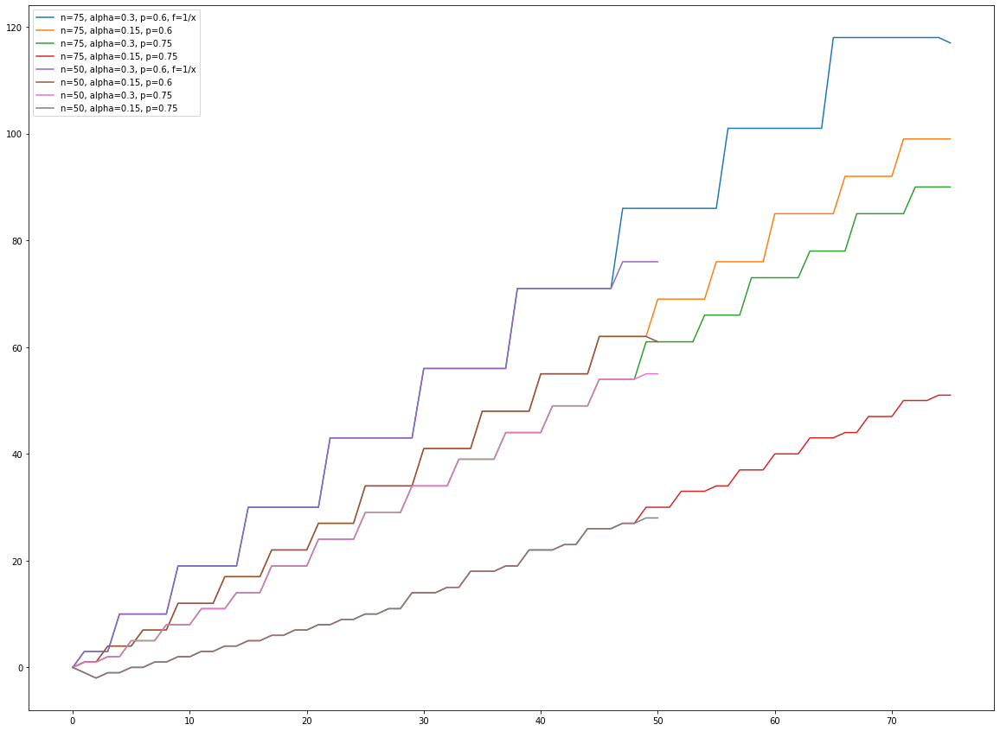

In [256]:
plt.plot(d1,label='n=75, alpha=0.3, p=0.6, f=1/x')
plt.plot(d2,label='n=75, alpha=0.15, p=0.6')
plt.plot(d3,label='n=75, alpha=0.3, p=0.75')
plt.plot(d4,label='n=75, alpha=0.15, p=0.75')
plt.plot(d111,label='n=50, alpha=0.3, p=0.6, f=1/x')
plt.plot(d222,label='n=50, alpha=0.15, p=0.6')
plt.plot(d333,label='n=50, alpha=0.3, p=0.75')
plt.plot(d444,label='n=50, alpha=0.15, p=0.75')
plt.legend()
plt.show()

to-do: do same w random graphs, change number of edges, show fosd property
    do linear networks, market entry, show gap size goes up
    add edges to linear networks, existence of loops, show gap size and market entry

# On Random networks

In [299]:
nx.has_path(G,32,64)

True

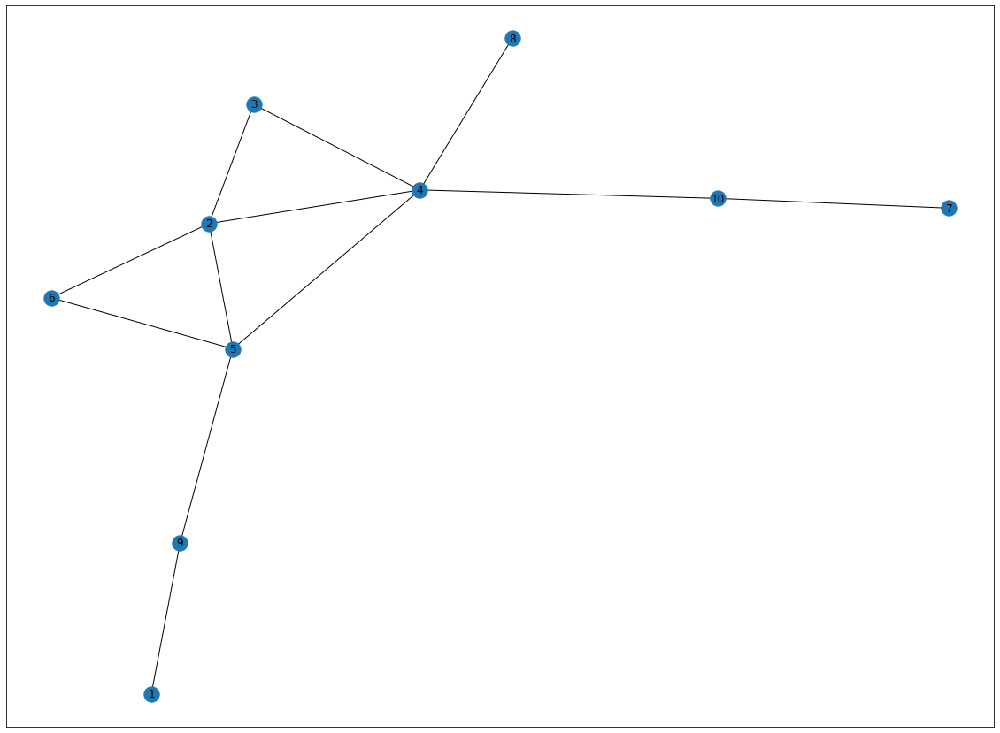

In [302]:
# Initialize network of n players with e edges
def startsr(n, e):
    G = nx.Graph()
    players=(np.arange(1,n+1))

    G.add_nodes_from(set(players))
    # initializing a newtork of n small firms

    for i in np.arange(e):
        u = random.choice(np.arange(1,n+1))
        v = random.choice(np.arange(1,n+1))
        G.add_edge(u, v)
#     for j in set(G.nodes()):
#         if sum([int(G.has_edge(i,j)) for i in set(G.nodes())])==0:
#             o = random.choice(np.arange(1,n+1))
#             G.add_edge(j, o)
    return G
G=startsr(10,15)
plt.rcParams["figure.figsize"] = (20,15)
nx.draw_networkx(G)

In [726]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        if nx.has_path(G, s, i):
            G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]
        else:
            G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]
            

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        if nx.has_path(G, s, i):
            G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]
        else:
            G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [727]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

kk1=[]
j=0
G=startsr(75,15)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk1.append(outcome)
    j+=1

    
    
kk2=[]
j=0
G=startsr(75,30)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk2.append(outcome)
    j+=1
    
kk3=[]
j=0
G=startsr(75,45)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk3.append(outcome)
    j+=1
    
    

kk4=[]
j=0
G=startsr(75,60)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk4.append(outcome)
    j+=1

    
    
kk5=[]
j=0
G=startsr(75,75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk5.append(outcome)
    j+=1
    
kk6=[]
j=0
G=startsr(75,100)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk6.append(outcome)
    j+=1
    
    
    

kk7=[]
j=0
G=startsr(75,125)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk7.append(outcome)
    j+=1

    
    
kk8=[]
j=0
G=startsr(75,150)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk8.append(outcome)
    j+=1
    
kk9=[]
j=0
G=startsr(75,175)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk9.append(outcome)
    j+=1
    


kk10=[]
j=0
G=startsr(75,200)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk10.append(outcome)
    j+=1

    
    
kk11=[]
j=0
G=startsr(75,225)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk11.append(outcome)
    j+=1
    
kk12=[]
j=0
G=startsr(75,250)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk12.append(outcome)
    j+=1
    
kk13=[]
j=0
G=startsr(75,275)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk13.append(outcome)
    j+=1
    
    
kk14=[]
j=0
G=startsr(75,300)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk14.append(outcome)
    j+=1
    
kk15=[]
j=0
G=startsr(75,325)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk15.append(outcome)
    j+=1

In [733]:
mpl.rcParams['figure.dpi']= 700
plt.plot(kk1,label='n = 75, e = 15',color='moccasin',linewidth=4)
plt.plot(kk2,label='n = 75, e = 30',color='gold',linewidth=4)
plt.plot(kk3,label='n = 75, e = 45',color='mediumturquoise',linewidth=4)

plt.plot(kk5,label='n = 75, e = 75',color='dodgerblue',linewidth=4)
plt.plot(kk6,label='n = 75, e = 100',color='cornflowerblue',linewidth=4)

plt.plot(kk8,label='n = 75, e = 150',color='navy',linewidth=4)

plt.plot(kk10,label='n = 75, e = 200',color='lightcoral',linewidth=4)

plt.plot(kk12,label='n = 75, e = 250',color='orangered',linewidth=4)

plt.plot(kk14,label='n = 75, e = 300',color='firebrick',linewidth=4)


plt.xlabel('Number of fight periods since the beginning of play', fontsize=35)
plt.ylabel('Cumulative payoff', fontsize=35)
plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

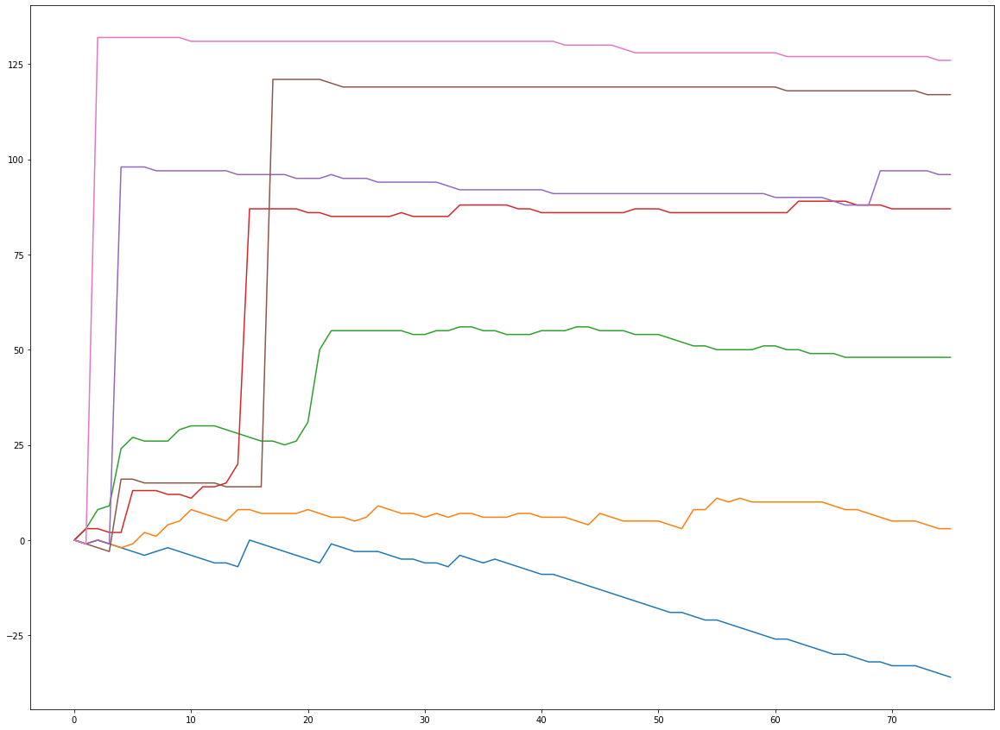

In [315]:
plt.plot(kk1)
plt.plot(kk2)
plt.plot(kk3)
plt.plot(kk4)
plt.plot(kk5)
plt.plot(kk6)
plt.plot(kk7)

In [324]:
for i in [kk1,kk2,kk3,kk4,kk5,kk6,kk7,kk8,kk9,kk10,kk11,kk12,kk13,kk14,kk15]:
    print(i.index(max(i)))

0
55
33
62
4
17
2
2
2
3
2
6
2
4
2


In [336]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.8

# Payoff values
a=2
b=0.5

kk1=[]
j=0
G=startsr(75,15)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk1.append(outcome)
    j+=1

    
    
kk2=[]
j=0
G=startsr(75,30)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk2.append(outcome)
    j+=1
    
kk3=[]
j=0
G=startsr(75,45)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk3.append(outcome)
    j+=1
    
    

kk4=[]
j=0
G=startsr(75,60)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk4.append(outcome)
    j+=1

    
    
kk5=[]
j=0
G=startsr(75,75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk5.append(outcome)
    j+=1
    
kk6=[]
j=0
G=startsr(75,100)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk6.append(outcome)
    j+=1
    
    
    

kk7=[]
j=0
G=startsr(75,125)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk7.append(outcome)
    j+=1

    
    
kk8=[]
j=0
G=startsr(75,150)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk8.append(outcome)
    j+=1
    
kk9=[]
j=0
G=startsr(75,175)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk9.append(outcome)
    j+=1
    


kk10=[]
j=0
G=startsr(75,200)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk10.append(outcome)
    j+=1

    
    
kk11=[]
j=0
G=startsr(75,225)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk11.append(outcome)
    j+=1
    
kk12=[]
j=0
G=startsr(75,250)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk12.append(outcome)
    j+=1
    
kk13=[]
j=0
G=startsr(75,275)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk13.append(outcome)
    j+=1
    
    
kk14=[]
j=0
G=startsr(75,300)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk14.append(outcome)
    j+=1
    
kk15=[]
j=0
G=startsr(75,325)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk15.append(outcome)
    j+=1

In [341]:
for i in [kk1,kk2,kk3,kk4,kk5,kk6,kk7,kk8,kk9,kk10,kk11,kk12,kk13,kk14,kk15]:
    print(max(i))

0
0
0
28
57
86
101
107
109
115
114
117
123
123
123


In [342]:
for i in [kk1,kk2,kk3,kk4,kk5,kk6,kk7,kk8,kk9,kk10,kk11,kk12,kk13,kk14,kk15]:
    print(i.index(max(i)))

0
0
0
40
57
48
65
36
61
19
66
29
14
22
33


In [340]:
# Setup parameter values
sigma=1
alpha=0.1
p=0.8

# Payoff values
a=2
b=0.5

kk1=[]
j=0
G=startsr(75,15)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk1.append(outcome)
    j+=1

    
    
kk2=[]
j=0
G=startsr(75,30)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk2.append(outcome)
    j+=1
    
kk3=[]
j=0
G=startsr(75,45)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk3.append(outcome)
    j+=1
    
    

kk4=[]
j=0
G=startsr(75,60)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk4.append(outcome)
    j+=1

    
    
kk5=[]
j=0
G=startsr(75,75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk5.append(outcome)
    j+=1
    
kk6=[]
j=0
G=startsr(75,100)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk6.append(outcome)
    j+=1
    
    
    

kk7=[]
j=0
G=startsr(75,125)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk7.append(outcome)
    j+=1

    
    
kk8=[]
j=0
G=startsr(75,150)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk8.append(outcome)
    j+=1
    
kk9=[]
j=0
G=startsr(75,175)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk9.append(outcome)
    j+=1
    


kk10=[]
j=0
G=startsr(75,200)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk10.append(outcome)
    j+=1

    
    
kk11=[]
j=0
G=startsr(75,225)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk11.append(outcome)
    j+=1
    
kk12=[]
j=0
G=startsr(75,250)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk12.append(outcome)
    j+=1
    
kk13=[]
j=0
G=startsr(75,275)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk13.append(outcome)
    j+=1
    
    
kk14=[]
j=0
G=startsr(75,300)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk14.append(outcome)
    j+=1
    
kk15=[]
j=0
G=startsr(75,325)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk15.append(outcome)
    j+=1

In [346]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

kk1=[]
j=0
G=startsr(50,15)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk1.append(outcome)
    j+=1

    
    
kk2=[]
j=0
G=startsr(50,30)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk2.append(outcome)
    j+=1
    
kk3=[]
j=0
G=startsr(50,45)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk3.append(outcome)
    j+=1
    
    

kk4=[]
j=0
G=startsr(50,60)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk4.append(outcome)
    j+=1

    
    
kk5=[]
j=0
G=startsr(50,75)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk5.append(outcome)
    j+=1
    
kk6=[]
j=0
G=startsr(50,100)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk6.append(outcome)
    j+=1
    
    
    

kk7=[]
j=0
G=startsr(50,125)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk7.append(outcome)
    j+=1

    
    
kk8=[]
j=0
G=startsr(50,150)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk8.append(outcome)
    j+=1
    
kk9=[]
j=0
G=startsr(50,175)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk9.append(outcome)
    j+=1
    


kk10=[]
j=0
G=startsr(50,200)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk10.append(outcome)
    j+=1

    
    
kk11=[]
j=0
G=startsr(50,225)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk11.append(outcome)
    j+=1
    
kk12=[]
j=0
G=startsr(50,250)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk12.append(outcome)
    j+=1
    
kk13=[]
j=0
G=startsr(50,275)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk13.append(outcome)
    j+=1
    
    
kk14=[]
j=0
G=startsr(50,300)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk14.append(outcome)
    j+=1
    
kk15=[]
j=0
G=startsr(50,325)
T=50
s=(np.arange(1,51)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk15.append(outcome)
    j+=1

In [347]:
for i in [kk1,kk2,kk3,kk4,kk5,kk6,kk7,kk8,kk9,kk10,kk11,kk12,kk13,kk14,kk15]:
    print(i.index(max(i)))

5
22
38
37
29
2
2
2
2
2
2
5
5
15
1


In [348]:
for i in [kk1,kk2,kk3,kk4,kk5,kk6,kk7,kk8,kk9,kk10,kk11,kk12,kk13,kk14,kk15]:
    print(max(i))

11
40
65
79
86
92
94
94
94
94
94
94
94
94
97


# Looping

In [381]:
outcome1=[]
    outcome11=[]
    outcome2=[]
    outcome22=[]
    outcome3=[]
    outcome33=[]
    outcome4=[]
    outcome44=[]
    outcome5=[]
    outcome55=[]
    outcome6=[]
    outcome66=[]
    outcome7=[]
    outcome77=[]
    outcome8=[]
    outcome88=[]
    outcome9=[]
    outcome99=[]
    outcome10=[]
    outcome1010=[]
    outcome1111=[]
    outcome111111=[]
    outcome12=[]
    outcome1212=[]
    outcome13=[]
    outcome1313=[]
    outcome14=[]
    outcome1414=[]
    outcome15=[]
    outcome1515=[]

IndentationError: unexpected indent (<ipython-input-381-e89573573e78>, line 2)

In [382]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5
def letsplay(u, loop):
    mu=0
    outcome1=[]
    outcome11=[]
    outcome2=[]
    outcome22=[]
    outcome3=[]
    outcome33=[]
    outcome4=[]
    outcome44=[]
    outcome5=[]
    outcome55=[]
    outcome6=[]
    outcome66=[]
    outcome7=[]
    outcome77=[]
    outcome8=[]
    outcome88=[]
    outcome9=[]
    outcome99=[]
    outcome10=[]
    outcome1010=[]
    outcome1111=[]
    outcome111111=[]
    outcome12=[]
    outcome1212=[]
    outcome13=[]
    outcome1313=[]
    outcome14=[]
    outcome1414=[]
    outcome15=[]
    outcome1515=[]
    while mu<loop:
        kk1=[]
        j=0
        G=startsr(u,15)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk1.append(outcome)
            j+=1



        kk2=[]
        j=0
        G=startsr(u,30)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk2.append(outcome)
            j+=1

        kk3=[]
        j=0
        G=startsr(u,45)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk3.append(outcome)
            j+=1



        kk4=[]
        j=0
        G=startsr(u,60)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk4.append(outcome)
            j+=1



        kk5=[]
        j=0
        G=startsr(u,75)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk5.append(outcome)
            j+=1

        kk6=[]
        j=0
        G=startsr(u,100)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk6.append(outcome)
            j+=1




        kk7=[]
        j=0
        G=startsr(u,125)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk7.append(outcome)
            j+=1



        kk8=[]
        j=0
        G=startsr(u,150)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk8.append(outcome)
            j+=1

        kk9=[]
        j=0
        G=startsr(u,175)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk9.append(outcome)
            j+=1



        kk10=[]
        j=0
        G=startsr(u,200)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk10.append(outcome)
            j+=1



        kk11=[]
        j=0
        G=startsr(u,225)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk11.append(outcome)
            j+=1

        kk12=[]
        j=0
        G=startsr(u,250)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk12.append(outcome)
            j+=1

        kk13=[]
        j=0
        G=startsr(u,275)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk13.append(outcome)
            j+=1


        kk14=[]
        j=0
        G=startsr(u,300)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk14.append(outcome)
            j+=1

        kk15=[]
        j=0
        G=startsr(u,325)
        T=u
        s=(np.arange(1,u+1)).tolist()
        while j < len(G.nodes)+1:
        #     G=start(5)
            initial_beliefs(0.5,G) 
            x=['F']*j+['A']*(len(G.nodes)-j)
            outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
            kk15.append(outcome)
            j+=1
        outcome1.append(max(kk1))
        outcome11.append(kk1.index(max(kk1)))
        outcome2.append(max(kk2))
        outcome22.append(kk2.index(max(kk2)))
        outcome3.append(max(kk3))
        outcome33.append(kk3.index(max(kk3)))
        outcome4.append(max(kk4))
        outcome44.append(kk4.index(max(kk4)))
        outcome5.append(max(kk5))
        outcome55.append(kk5.index(max(kk5)))
        outcome6.append(max(kk6))
        outcome66.append(kk6.index(max(kk6)))
        outcome7.append(max(kk7))
        outcome77.append(kk7.index(max(kk7)))
        outcome8.append(max(kk8))
        outcome88.append(kk8.index(max(kk8)))
        outcome9.append(max(kk9))
        outcome99.append(kk9.index(max(kk9)))
        outcome10.append(max(kk10))
        outcome1010.append(kk10.index(max(kk10)))
        outcome1111.append(max(kk11))
        outcome111111.append(kk11.index(max(kk11)))

        outcome12.append(max(kk12))
        outcome1212.append(kk12.index(max(kk12)))
        outcome13.append(max(kk13))
        outcome1313.append(kk13.index(max(kk13)))
        outcome14.append(max(kk14))
        outcome1414.append(kk14.index(max(kk14)))
        outcome15.append(max(kk15))
        outcome1515.append(kk15.index(max(kk15)))

        mu+=1
    return [outcome1, outcome2, outcome3, outcome4, outcome5, outcome6, 
          outcome7, outcome8, outcome9, outcome10, outcome1111, outcome12, 
          outcome13, outcome14, outcome15, outcome11, outcome22, outcome33, outcome44, outcome55, outcome66, 
          outcome77, outcome88, outcome99, outcome1010, outcome111111, outcome1212, 
          outcome1313, outcome1414, outcome1515]

In [383]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

In [374]:
poo=15
while poo<30:
    print(np.mean(a[poo]))
    poo+=1

4.0
29.8
27.9
32.3
30.9
10.2
6.5
4.7
2.4
2.6
2.2
3.2
2.6
3.0
2.3


In [367]:
a=[[0, 0, 5, 0, 0, 5, 0, 6, 1, 3],
 [24, 30, 19, 28, 22, 19, 16, 23, 19, 35],
 [60, 68, 54, 48, 51, 53, 67, 46, 50, 45],
 [87, 94, 79, 90, 83, 86, 84, 84, 92, 84],
 [109, 108, 113, 111, 104, 112, 110, 116, 113, 109],
 [130, 131, 129, 126, 124, 121, 125, 135, 130, 134],
 [136, 142, 136, 140, 140, 131, 136, 136, 138, 133],
 [140, 142, 142, 141, 142, 136, 142, 140, 144, 142],
 [142, 144, 144, 144, 144, 140, 142, 142, 144, 142],
 [144, 142, 144, 144, 144, 142, 142, 144, 144, 144],
 [144, 144, 142, 142, 142, 144, 144, 144, 144, 144],
 [144, 144, 144, 144, 144, 142, 144, 144, 144, 144],
 [144, 144, 144, 144, 144, 144, 142, 144, 144, 144],
 [144, 144, 144, 144, 144, 144, 144, 144, 144, 144],
 [144, 144, 144, 144, 144, 144, 144, 144, 144, 144],
 [0, 0, 5, 0, 0, 9, 0, 10, 9, 7],
 [38, 18, 41, 27, 49, 14, 52, 27, 27, 5],
 [19, 14, 21, 45, 15, 35, 23, 33, 49, 25],
 [52, 7, 47, 46, 28, 36, 20, 31, 32, 24],
 [44, 23, 39, 18, 33, 46, 29, 6, 30, 41],
 [12, 5, 3, 9, 17, 13, 3, 3, 13, 24],
 [2, 2, 2, 2, 3, 20, 2, 25, 2, 5],
 [3, 2, 2, 3, 2, 25, 2, 2, 4, 2],
 [3, 2, 2, 2, 2, 2, 2, 3, 2, 4],
 [2, 3, 5, 2, 2, 3, 2, 2, 3, 2],
 [2, 2, 2, 2, 2, 2, 2, 2, 2, 4],
 [8, 2, 2, 2, 2, 5, 2, 2, 2, 5],
 [3, 2, 2, 2, 2, 2, 3, 5, 3, 2],
 [2, 2, 4, 2, 2, 3, 6, 4, 3, 2],
 [2, 2, 3, 3, 3, 2, 2, 2, 2, 2]]

In [384]:
letsplay(75, 10)

In [385]:
b=letsplay(50, 10)

In [386]:
b

[[10, 4, 7, 7, 7, 6, 4, 12, 3, 4],
 [39, 46, 44, 31, 32, 43, 36, 39, 36, 33],
 [72, 55, 63, 67, 58, 59, 76, 63, 73, 59],
 [78, 78, 68, 78, 84, 82, 80, 81, 75, 82],
 [80, 85, 92, 84, 86, 85, 88, 92, 82, 84],
 [87, 87, 94, 92, 94, 92, 91, 94, 94, 94],
 [94, 94, 92, 94, 94, 94, 92, 94, 94, 94],
 [94, 94, 89, 94, 94, 94, 90, 94, 94, 94],
 [94, 94, 94, 94, 94, 94, 94, 94, 94, 94],
 [94, 94, 94, 94, 94, 94, 94, 94, 94, 94],
 [94, 94, 94, 94, 94, 94, 94, 94, 94, 94],
 [94, 94, 94, 94, 94, 94, 94, 94, 94, 94],
 [94, 94, 94, 94, 94, 94, 94, 94, 94, 94],
 [94, 94, 94, 94, 94, 94, 94, 94, 94, 94],
 [94, 94, 97, 94, 94, 94, 94, 94, 94, 94],
 [19, 2, 10, 1, 15, 13, 19, 12, 33, 20],
 [19, 6, 13, 33, 27, 5, 28, 9, 9, 25],
 [14, 17, 9, 13, 19, 22, 5, 13, 3, 18],
 [10, 2, 9, 24, 2, 4, 6, 4, 4, 3],
 [4, 4, 2, 2, 3, 18, 2, 2, 2, 24],
 [3, 6, 2, 2, 2, 2, 4, 2, 2, 2],
 [2, 2, 4, 3, 2, 8, 4, 2, 3, 2],
 [5, 2, 3, 5, 2, 2, 2, 3, 2, 3],
 [3, 2, 3, 5, 2, 3, 3, 8, 4, 3],
 [2, 2, 5, 2, 2, 5, 6, 4, 2, 8],
 [9, 2, 

In [387]:
poo=0
while poo<15:
    print(np.mean(b[poo]))
    poo+=1

6.4
37.9
64.5
78.6
85.8
91.9
93.6
93.1
94.0
94.0
94.0
94.0
94.0
94.0
94.3


In [388]:
poo=15
while poo<30:
    print(np.mean(b[poo]))
    poo+=1

14.4
17.4
13.3
6.8
6.3
2.7
3.2
2.9
3.6
3.8
7.0
12.6
14.1
14.0
10.5


In [389]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.8

# Payoff values
a=2
b=0.5

In [390]:
c=letsplay(75,10)

In [391]:
poo=0
while poo<15:
    print(np.mean(c[poo]))
    poo+=1

0.0
0.1
24.4
64.2
88.5
112.2
124.5
130.1
134.2
135.7
137.8
137.2
138.0
138.0
138.0


In [392]:
poo=15
while poo<30:
    print(np.mean(c[poo]))
    poo+=1

0.0
0.5
37.8
32.8
31.8
31.4
28.3
17.3
26.2
13.3
5.6
16.4
9.2
16.0
15.0


In [393]:
d=letsplay(50,10)

In [394]:
poo=0
while poo<15:
    print(np.mean(d[poo]))
    poo+=1

0.0
11.1
45.4
66.0
77.1
83.2
86.6
87.8
88.3
89.2
89.2
90.4
90.2
91.0
91.0


In [395]:
poo=15
while poo<30:
    print(np.mean(d[poo]))
    poo+=1

0.0
23.7
21.4
18.8
18.5
18.1
14.7
10.4
12.8
17.0
21.8
4.2
4.9
3.4
4.2


In [396]:
# Setup parameter values
sigma=1
alpha=0.1
p=0.8

# Payoff values
a=2
b=0.5

In [397]:
e=letsplay(75,10)

In [398]:
poo=0
while poo<15:
    print(np.mean(e[poo]))
    poo+=1

0.0
0.0
0.9
22.1
54.5
80.9
97.6
106.2
111.7
115.3
117.0
119.7
120.4
121.8
123.0


In [399]:
poo=15
while poo<30:
    print(np.mean(e[poo]))
    poo+=1

0.0
0.0
8.0
47.9
44.6
44.4
46.0
41.6
38.6
36.4
39.6
40.3
38.5
26.8
35.2


In [400]:
f=letsplay(50,10)

In [404]:
poo=0
while poo<15:
    print(np.mean(f[poo]))
    poo+=1


0.0
0.1
16.1
43.8
53.6
62.2
68.0
71.4
72.4
74.3
75.1
77.5
77.7
78.3
79.0


In [405]:
poo=15
while poo<30:
    print(np.mean(f[poo]))
    poo+=1

0.0
2.5
29.3
28.7
30.5
31.5
26.9
25.3
22.7
22.4
26.6
18.7
16.9
22.5
14.9


In [406]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

In [407]:
g=letsplay(50,5)

In [408]:
h=letsplay(50,10)

In [409]:
i=letsplay(50,15)

In [415]:
poo=0
while poo<15:
    print(np.mean(g[poo]))
    poo+=1

poo=15
while poo<30:
    print(np.mean(g[poo]))
    poo+=1

4.8
38.0
65.0
81.8
86.2
92.0
91.8
93.6
94.0
94.0
94.0
94.0
94.0
94.0
94.6
8.4
22.2
14.4
7.4
9.6
3.2
3.0
3.4
4.4
5.0
12.8
6.0
5.6
15.8
10.8


In [417]:
poo=0
while poo<15:
    print(np.mean(h[poo]))
    poo+=1

poo=15
while poo<30:
    print(np.mean(h[poo]))
    poo+=1

7.5
37.2
67.1
81.0
87.3
92.2
92.4
94.0
94.0
94.0
94.0
94.0
94.1
94.6
94.6
6.8
18.0
13.9
18.7
8.0
2.5
2.4
2.6
4.9
4.3
7.0
5.7
13.4
15.5
14.4


In [416]:
poo=0
while poo<15:
    print(np.mean(i[poo]))
    poo+=1

poo=15
while poo<30:
    print(np.mean(i[poo]))
    poo+=1

8.4
37.333333333333336
65.66666666666667
78.86666666666666
87.73333333333333
91.53333333333333
93.13333333333334
93.73333333333333
94.0
93.86666666666666
94.0
94.0
94.0
94.6
94.6
9.533333333333333
20.066666666666666
15.066666666666666
13.666666666666666
11.2
2.3333333333333335
3.0
2.533333333333333
4.933333333333334
5.266666666666667
5.066666666666666
8.466666666666667
8.133333333333333
10.0
12.466666666666667


## Payoff Plots

In [307]:
# Setup parameter values
sigma=1
alpha=0.3
p=0.6

# Payoff values
a=2
b=0.5

kk1=[]
j=0
G=startsr(75,15)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk1.append(outcome)
    j+=1

    
    
kk2=[]
j=0
G=startsr(75,30)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk2.append(outcome)
    j+=1
    
kk3=[]
j=0
G=startsr(75,45)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk3.append(outcome)
    j+=1
    
    

kk4=[]
j=0
G=startsr(75,60)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk4.append(outcome)
    j+=1

    
    
kk5=[]
j=0
G=startsr(75,75)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk5.append(outcome)
    j+=1
    
kk6=[]
j=0
G=startsr(75,100)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk6.append(outcome)
    j+=1
    
    
    

kk7=[]
j=0
G=startsr(75,125)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk7.append(outcome)
    j+=1

    
    
kk8=[]
j=0
G=startsr(75,150)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk8.append(outcome)
    j+=1
    
kk9=[]
j=0
G=startsr(75,175)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk9.append(outcome)
    j+=1
    


kk10=[]
j=0
G=startsr(75,200)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk10.append(outcome)
    j+=1

    
    
kk11=[]
j=0
G=startsr(75,225)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk11.append(outcome)
    j+=1
    
kk12=[]
j=0
G=startsr(75,250)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk12.append(outcome)
    j+=1
    
kk13=[]
j=0
G=startsr(75,275)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk13.append(outcome)
    j+=1
    
    
kk14=[]
j=0
G=startsr(75,300)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk14.append(outcome)
    j+=1
    
kk15=[]
j=0
G=startsr(75,325)
T=75
s=(np.arange(1,76)).tolist()
while j < len(G.nodes)+1:
#     G=start(5)
    initial_beliefs(0.5,G) 
    x=['F']*j+['A']*(len(G.nodes)-j)
    outcome=sum(game(G, x, a,b,T,p,sigma,s)[0])
    kk15.append(outcome)
    j+=1

In [ ]:
import seaborn as sns
sns.lineplot

## Market entry simulations

In [ ]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [529]:
# Fight stage game, s is a small player
def stagef(G,s):
    
    G.nodes[s]['belief']+=[1]

    for i in set(G.nodes)-set([s]):
        if nx.has_path(G, s, i):
            G.nodes[i]['belief']+=[min(1,G.nodes[i]['belief'][-1]+alpha/(len(nx.shortest_path(G, i, s))-1))]
        else:
            G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]
            

        
# Fight stage game, s is a small player
def stagea(G,s):
    
    G.nodes[s]['belief']+=[0]

    for i in set(G.nodes)-set([s]):
        if nx.has_path(G, s, i):
            G.nodes[i]['belief']+=[max(0,G.nodes[i]['belief'][-1]-alpha/(len(nx.shortest_path(G, i, s))-1))]
        else:
            G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]


        
# s stays out, s is a small player
def stageo(G,s):
    for i in set(G.nodes):
        G.nodes[i]['belief']+=[G.nodes[i]['belief'][-1]]




In [ ]:
# entry on linear small network with loops

In [421]:
G=start(20)
G1=start(20)
G2=start(20)
G3=start(20)
G4=start(20)
G5=start(20)
G6=start(20)
G7=start(20)
G8=start(20)
G9=start(20)
G10=start(20)
G1.add_edge(1,2)
G2.add_edge(1,4)
G3.add_edge(1,6)
G4.add_edge(1,8)
G5.add_edge(1,10)
G6.add_edge(1,12)
G7.add_edge(1,14)
G8.add_edge(1,16)
G9.add_edge(1,18)
G10.add_edge(1,20)

In [422]:
initial_beliefs(0.5,G) 
initial_beliefs(0.5,G1) 
initial_beliefs(0.5,G2) 
initial_beliefs(0.5,G3) 
initial_beliefs(0.5,G4) 
initial_beliefs(0.5,G5)
initial_beliefs(0.5,G6) 
initial_beliefs(0.5,G7) 
initial_beliefs(0.5,G8)
initial_beliefs(0.5,G9) 
initial_beliefs(0.5,G10) 

In [ ]:
# fixed entrant sequence
s=(np.arange(1,21)).tolist()
sigma=1
T=20
alpha=0.3
p=0.6
x=['F']*20+['A']*0
e20=game(G, x, 2,0.5, T,p,sigma,s)[1]
e202=game(G1, x, 2,0.5, T,p,sigma,s)[1]
e204=game(G2, x, 2,0.5, T,p,sigma,s)[1]
e206=game(G3, x, 2,0.5, T,p,sigma,s)[1]
e208=game(G4, x, 2,0.5, T,p,sigma,s)[1]
e2010=game(G5, x, 2,0.5, T,p,sigma,s)[1]
e2012=game(G6, x, 2,0.5, T,p,sigma,s)[1]
e2014=game(G7, x, 2,0.5, T,p,sigma,s)[1]
e2016=game(G8, x, 2,0.5, T,p,sigma,s)[1]
e2018=game(G9, x, 2,0.5, T,p,sigma,s)[1]
e2020=game(G10, x, 2,0.5, T,p,sigma,s)[1]

In [ ]:
# entry on random networks with varying number of edges

In [424]:
H=startsr(50, 5)
H1=startsr(50, 15)
H2=startsr(50, 25)
H3=startsr(50, 35)
H4=startsr(50, 50)
H5=startsr(50, 65)
H6=startsr(50, 75)
H7=startsr(50, 100)
H8=startsr(50, 125)
H9=startsr(50, 150)

In [426]:
initial_beliefs(0.5,H) 
initial_beliefs(0.5,H1) 
initial_beliefs(0.5,H2) 
initial_beliefs(0.5,H3) 
initial_beliefs(0.5,H4) 
initial_beliefs(0.5,H5)
initial_beliefs(0.5,H6) 
initial_beliefs(0.5,H7) 
initial_beliefs(0.5,H8)
initial_beliefs(0.5,H9) 

In [ ]:
s=(np.arange(1,51)).tolist()
sigma=1
T=50
alpha=0.3
p=0.6
x=['F']*50+['A']*0
e50=game(H, x, 2,0.5, T,p,sigma,s)[1]
e202=game(H1, x, 2,0.5, T,p,sigma,s)[1]
e204=game(H2, x, 2,0.5, T,p,sigma,s)[1]
e206=game(H3, x, 2,0.5, T,p,sigma,s)[1]
e208=game(H4, x, 2,0.5, T,p,sigma,s)[1]
e2010=game(H5, x, 2,0.5, T,p,sigma,s)[1]
e2012=game(H6, x, 2,0.5, T,p,sigma,s)[1]
e2014=game(H7, x, 2,0.5, T,p,sigma,s)[1]
e2016=game(H8, x, 2,0.5, T,p,sigma,s)[1]
e2018=game(H9, x, 2,0.5, T,p,sigma,s)[1]

In [ ]:
s=(np.arange(1,21)).tolist()
sigma=1
T=20
alpha=0.3
p=0.6
x=['F']*20+['A']*0
e20=game(G, x, 2,0.5, T,p,sigma,s)[1]
e202=game(G1, x, 2,0.5, T,p,sigma,s)[1]
e204=game(G2, x, 2,0.5, T,p,sigma,s)[1]
e206=game(G3, x, 2,0.5, T,p,sigma,s)[1]
e208=game(G4, x, 2,0.5, T,p,sigma,s)[1]
e2010=game(G5, x, 2,0.5, T,p,sigma,s)[1]
e2012=game(G6, x, 2,0.5, T,p,sigma,s)[1]
e2014=game(G7, x, 2,0.5, T,p,sigma,s)[1]
e2016=game(G8, x, 2,0.5, T,p,sigma,s)[1]
e2018=game(G9, x, 2,0.5, T,p,sigma,s)[1]
e2020=game(G10, x, 2,0.5, T,p,sigma,s)[1]

In [ ]:
# entry on just linear networks with high number of nodes

In [454]:
G=start(200)
initial_beliefs(0.5,G) 
s=(np.arange(1,201)).tolist()
sigma=1
T=200
alpha=0.3
p=0.6
x=['F']*200+['A']*0
# sum(game(G, x, 2,0.5, T,p,sigma,s)[0])
e200=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [433]:
G=start(1500)
initial_beliefs(0.1,G) 
s=(np.arange(1,1501)).tolist()
sigma=1
T=1500
p=0.6
alpha=0.3
x=['F']*1500+['A']*0
# sum(game(G, x, 2,0.5, p,T,sigma,s)[0])
e1500=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [434]:
G=start(1500)
initial_beliefs(0.5,G) 
s=(np.arange(1,1501)).tolist()
sigma=1
T=1500
p=0.6
alpha=0.3
x=['F']*1500+['A']*0
# sum(game(G, x, 2,0.5, p,T,sigma,s)[0])
e1500new=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [579]:
e1500_=np.array(e1500)
A1500=np.where(e1500_=='I')
e1500_n=np.array(e1500new)
A1500n=np.where(e1500_n=='I')

A1500=list(A1500[0])
A1500n=list(A1500n[0])
gap1500=[y-x-1 for x, y in zip(A1500[:-1], A1500[1:])]
gap1500n=[y-x-1 for x, y in zip(A1500n[:-1], A1500n[1:])]
gap1500

[0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 2,
 1,
 2,
 1,
 2,
 1,
 2,
 2,
 1,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 3,
 2,
 2,
 3,
 2,
 2,
 3,
 2,
 2,
 3,
 2,
 2,
 3,
 2,
 3,
 2,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 2,
 3,
 3,
 2,
 3,
 2,
 3,
 3,
 2,
 3,
 2,
 3,
 3,
 2,
 3,
 3,
 2,
 3,
 3,
 2,
 3,
 3,
 2,
 3,
 3,
 2,
 3,
 3,
 2,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,


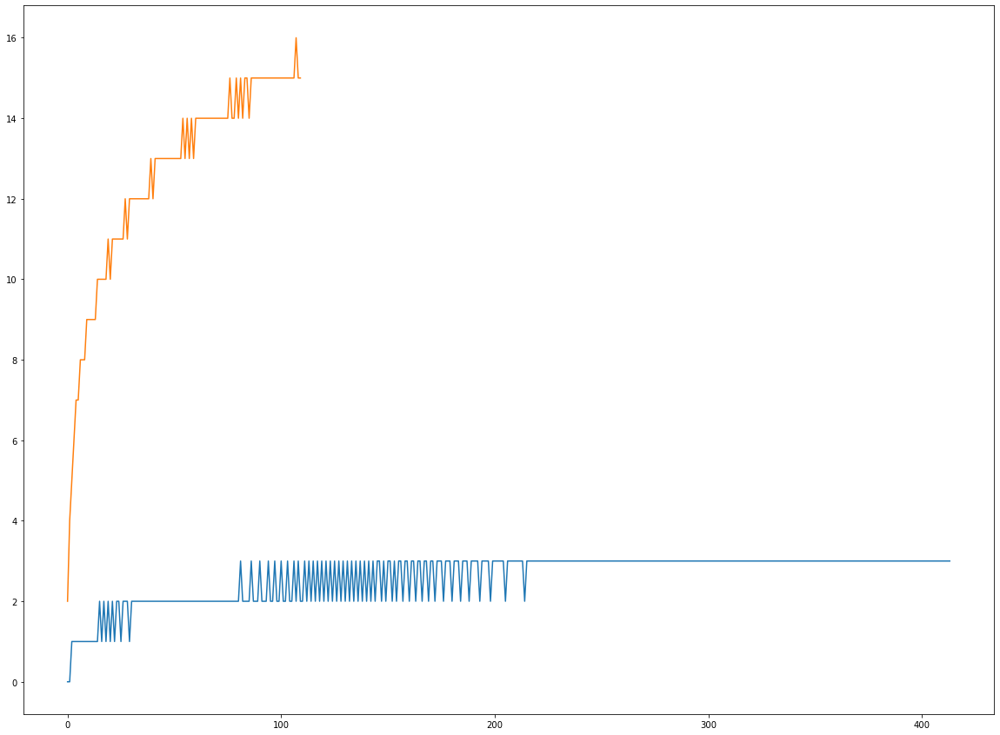

In [584]:
plt.plot(gap1500,label='initial belief=0.1')
plt.plot(gap1500n,label='initial belief=0.5')

In [437]:
G=start(1000)
initial_beliefs(0.5,G) 
s=(np.arange(1,1001)).tolist()
sigma=1
T=1000
p=0.6
alpha=0.3
x=['F']*1000+['A']*0

e1000=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [438]:
G=start(900)
initial_beliefs(0.5,G) 
s=(np.arange(1,901)).tolist()
sigma=1
T=900
p=0.6
alpha=0.3
x=['F']*900+['A']*0

e900=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [439]:
G=start(800)
initial_beliefs(0.5,G) 
s=(np.arange(1,801)).tolist()
sigma=1
T=800
p=0.6
alpha=0.3
x=['F']*800+['A']*0

e800=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [440]:
G=start(700)
initial_beliefs(0.5,G) 
s=(np.arange(1,701)).tolist()
sigma=1
T=700
p=0.6
alpha=0.3
x=['F']*700+['A']*0

e700=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [441]:
G=start(600)
initial_beliefs(0.5,G) 
s=(np.arange(1,601)).tolist()
sigma=1
T=600
p=0.6
alpha=0.3
x=['F']*600+['A']*0

e600=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [442]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.3
x=['F']*500+['A']*0

e500=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [443]:
def loop_entry(u, iter):
    entry=[]
    j=0
    G=start(u)
    sigma=1
    alpha=0.3
    p=0.6
    # Payoff values
    a=2
    b=0.5
    while j<iter:
        G=start(u)
        initial_beliefs(0.5,G) 
        s=(np.arange(1,u+1)).tolist()
        T=u
        x=['F']*u+['A']*0
        outcome=game(G, x, 2,0.5, T,p,sigma,s)[1]
        entry.append(outcome)
        j+=1
        
    return entry   

In [453]:
# entr250_25=loop_entry(250,25)
# entr250_50=loop_entry(250,50)
# entr250_100=loop_entry(250,100)
# entr250_250=loop_entry(250,250)


# entr500_25=loop_entry(500,25)
# entr500_50=loop_entry(500,50)
# entr500_100=loop_entry(500,100)


In [604]:
w=0
lengths=[]
gaps=[]
while w<250:
    ee=np.array(entr250_250[w])
    A=np.where(ee=='I')
    A=list(A[0])
    length=len(A)
    gap=[y-x-1 for x, y in zip(A[:-1], A[1:])]
    lengths.append(length)
    gaps.append(gap)
    w+=1
    

In [514]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.1
x=['F']*500+['A']*0
e500_01=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [515]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.2
x=['F']*500+['A']*0
e500_02=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [516]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.3
x=['F']*500+['A']*0
e500_03=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [517]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.4
x=['F']*500+['A']*0
e500_04=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [518]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.5
x=['F']*500+['A']*0
e500_05=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [519]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.6
x=['F']*500+['A']*0
e500_06=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [520]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.7
x=['F']*500+['A']*0
e500_07=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [521]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.8
x=['F']*500+['A']*0
e500_08=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [522]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=0.9
x=['F']*500+['A']*0
e500_09=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [531]:
G=start(500)
initial_beliefs(0.5,G) 
s=(np.arange(1,501)).tolist()
sigma=1
T=500
p=0.6
alpha=1
x=['F']*500+['A']*0
e500_10=game(G, x, 2,0.5, T,p,sigma,s)[1]

In [651]:
ee500_01=np.array(e500_01)
ee500_02=np.array(e500_02)
ee500_03=np.array(e500_03)
ee500_04=np.array(e500_04)
ee500_05=np.array(e500_05)
ee500_06=np.array(e500_06)
ee500_07=np.array(e500_07)
ee500_08=np.array(e500_08)
ee500_09=np.array(e500_09)
ee500_10=np.array(e500_10)
A1=np.where(ee500_01=='I')
A2=np.where(ee500_02=='I')
A3=np.where(ee500_03=='I')
A4=np.where(ee500_04=='I')
A5=np.where(ee500_05=='I')
A6=np.where(ee500_06=='I')
A7=np.where(ee500_07=='I')
A8=np.where(ee500_08=='I')
A9=np.where(ee500_09=='I')
A10=np.where(ee500_10=='I')
A1=list(A1[0])
A2=list(A2[0])
A3=list(A3[0])
A4=list(A4[0])
A5=list(A5[0])
A6=list(A6[0])
A7=list(A7[0])
A8=list(A8[0])
A9=list(A9[0])
A10=list(A10[0])
gap1=[y-x-1 for x, y in zip(A1[:-1], A1[1:])]
gap2=[y-x-1 for x, y in zip(A2[:-1], A2[1:])]
gap3=[y-x-1 for x, y in zip(A3[:-1], A3[1:])]
gap4=[y-x-1 for x, y in zip(A4[:-1], A4[1:])]
gap5=[y-x-1 for x, y in zip(A5[:-1], A5[1:])]
gap6=[y-x-1 for x, y in zip(A6[:-1], A6[1:])]
gap7=[y-x-1 for x, y in zip(A7[:-1], A7[1:])]
gap8=[y-x-1 for x, y in zip(A8[:-1], A8[1:])]
gap9=[y-x-1 for x, y in zip(A9[:-1], A9[1:])]
gap10=[y-x-1 for x, y in zip(A10[:-1], A10[1:])]

In [609]:
for x in [e500_01,e500_02,e500_03,e500_04,e500_05,e500_06,e500_07,e500_08,e500_09,e500_10]:
    print(sum([i=='I' for i in x]))

108
62
45
36
31
27
24
21
20
18


In [695]:
entrum1=list(zip(A1,[1]*(len(A1))))
entrum2=list(zip(A2,[1]*(len(A2))))
entrum3=list(zip(A3,[1]*(len(A3))))
entrum4=list(zip(A4,[1]*(len(A4))))
entrum5=list(zip(A5,[1]*(len(A5))))
entrum6=list(zip(A6,[1]*(len(A6))))
entrum7=list(zip(A7,[1]*(len(A7))))
entrum8=list(zip(A8,[1]*(len(A8))))
entrum9=list(zip(A9,[1]*(len(A9))))
entrum10=list(zip(A10,[1]*(len(A10))))

gapum1=list(zip([i+1 for i in A1]+[A1[-1]], gap1+[500-A1[-1]]))
gapum2=list(zip([i+1 for i in A2]+[A2[-1]], gap2+[500-A2[-1]]))
gapum3=list(zip([i+1 for i in A3]+[A3[-1]], gap3+[500-A3[-1]]))
gapum4=list(zip([i+1 for i in A4]+[A4[-1]], gap4+[500-A4[-1]])) 
gapum5=list(zip([i+1 for i in A5]+[A5[-1]], gap5+[500-A5[-1]]))
gapum6=list(zip([i+1 for i in A6]+[A6[-1]], gap6+[500-A6[-1]]))
gapum7=list(zip([i+1 for i in A7]+[A7[-1]], gap7+[500-A7[-1]]))
gapum8=list(zip([i+1 for i in A8]+[A8[-1]], gap8+[500-A8[-1]]))
gapum9=list(zip([i+1 for i in A9]+[A9[-1]], gap9+[500-A9[-1]]))
gapum10=list(zip([i+1 for i in A10]+[A10[-1]], gap10+[500-A10[-1]]))

In [677]:
entrum=[entrum1, entrum2, entrum3, entrum4, entrum5, entrum6, entrum7, entrum8, entrum9, entrum10]
gapum=[gapum1, gapum2, gapum3, gapum4, gapum5, gapum6, gapum7, gapum8, gapum9, gapum10]


In [741]:
import scipy.io as sp
import matplotlib.patches as mpatches
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 1000
plt.rcParams["figure.figsize"] = (28, 15)
fig, ax = plt.subplots()


ax.broken_barh(entrum1, (6, 6), facecolors='#74cdd7')#, label='ejns')
ax.broken_barh(gapum1, (6, 6), facecolors=('#e06666'))

ax.broken_barh(entrum2, (12, 6), facecolors='#74cdd7')
ax.broken_barh(gapum2, (12, 6), facecolors=('#e06666'))

ax.broken_barh(entrum3, (18, 6), facecolors='#74cdd7')
ax.broken_barh(gapum3, (18, 6), facecolors=('#e06666'))

ax.broken_barh(entrum4, (24, 6), facecolors='#74cdd7')
ax.broken_barh(gapum4, (24, 6), facecolors=('#e06666'))

ax.broken_barh(entrum5, (30, 6), facecolors='#74cdd7')#,label='ibs')
ax.broken_barh(gapum5, (30, 6), facecolors=('#e06666'))

ax.broken_barh(entrum6, (36, 6), facecolors='#74cdd7')
ax.broken_barh(gapum6, (36, 6), facecolors=('#e06666'))

ax.broken_barh(entrum7, (42, 6), facecolors='#74cdd7')
ax.broken_barh(gapum7, (42, 6), facecolors=('#e06666'))

ax.broken_barh(entrum8, (48, 6), facecolors='#74cdd7')
ax.broken_barh(gapum8, (48, 6), facecolors=('#e06666'))

ax.broken_barh(entrum9, (54, 6), facecolors='#74cdd7')#,label='ibs')
ax.broken_barh(gapum9, (54, 6), facecolors=('#e06666'))

ax.broken_barh(entrum10, (60, 6), facecolors='#74cdd7')#,label='nsks')
ax.broken_barh(gapum10, (60, 6), facecolors=('#e06666'))

labels=['alpha = 0.1','alpha = 0.2','alpha = 0.3','alpha = 0.4','alpha = 0.5','alpha = 0.6',
       'alpha = 0.7','alpha = 0.8','alpha = 0.9','alpha = 1.0']
plt.yticks(range(9,66,6), labels=labels)
plt.xlim(0,500)
plt.xlabel('Periods', fontsize=35)
# plt.ylabel('Payoff', fontsize=35)
# plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

(array([ 9, 15, 21, 27, 33, 39, 45, 51, 57, 63]),
 <a list of 10 Text major ticklabel objects>)

In [714]:
mpl.rcParams['figure.dpi']= 700
plt.plot(d1,label='n = 75, alpha = 0.3, b = 0.6',color='dodgerblue',linewidth=4)
plt.plot(d2,label='n = 75, alpha = 0.15, b = 0.6',color='navy',linewidth=4)
plt.plot(d3,label='n = 75, alpha = 0.3, b = 0.75',color='firebrick',linewidth=4)
plt.plot(d4,label='n = 75, alpha = 0.15, b = 0.75',color='orangered',linewidth=4)
plt.xlabel('Number of fight stages since the beginning of play', fontsize=35)
plt.ylabel('Payoff', fontsize=35)
plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

In [ ]:
plt.plot(kk1,label='n = 75, e = 15',color='moccasin',linewidth=4)
plt.plot(kk2,label='n = 75, e = 30',color='gold',linewidth=4)
plt.plot(kk3,label='n = 75, e = 45',color='mediumturquoise',linewidth=4)

plt.plot(kk5,label='n = 75, e = 75',color='dodgerblue',linewidth=4)
plt.plot(kk6,label='n = 75, e = 100',color='cornflowerblue',linewidth=4)

plt.plot(kk8,label='n = 75, e = 150',color='navy',linewidth=4)

plt.plot(kk10,label='n = 75, e = 200',color='lightcoral',linewidth=4)

plt.plot(kk12,label='n = 75, e = 250',color='orangered',linewidth=4)

plt.plot(kk14,label='n = 75, e = 300',color='firebrick',linewidth=4)

In [739]:
mpl.rcParams['figure.dpi']= 700
plt.plot(gap1,label='n = 500, b = 0.6, alpha = 0.1',color='moccasin',linewidth=4)
plt.plot(gap2,label='n = 500, b = 0.6, alpha = 0.2',color='gold',linewidth=4)
plt.plot(gap3,label='n = 500, b = 0.6, alpha = 0.3',color='mediumturquoise',linewidth=4)
plt.plot(gap4,label='n = 500, b = 0.6, alpha = 0.4',color='dodgerblue',linewidth=4)
plt.plot(gap5,label='n = 500, b = 0.6, alpha = 0.5',color='cornflowerblue',linewidth=4)
plt.plot(gap6,label='n = 500, b = 0.6, alpha = 0.6',color='navy',linewidth=4)
plt.plot(gap7,label='n = 500, b = 0.6, alpha = 0.7',color='lightcoral',linewidth=4)
plt.plot(gap8,label='n = 500, b = 0.6, alpha = 0.8',color='orangered',linewidth=4)
plt.plot(gap9,label='n = 500, b = 0.6, alpha = 0.9',color='firebrick',linewidth=4)
plt.plot(gap10,label='n = 500, b = 0.6, alpha = 1.0',color='orchid',linewidth=4)
plt.xlabel('Number of entries', fontsize=35)
plt.ylabel('Gap length', fontsize=35)
plt.legend(prop={'size': 26})
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.show()

In [737]:
gap1

[0,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 4,
 3,
 4,
 3,
 4,
 3,
 4,
 4,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 4,
 4,
 4,
 5,
 4,
 4,
 5,
 4,
 4,
 5,
 4,
 4,
 5,
 4,
 5,
 4,
 5,
 4,
 5,
 4,
 5,
 4,
 5,
 4,
 5,
 4,
 5]

In [ ]:
4.0
29.8
27.9
32.3
30.9
10.2
6.5
4.7
2.4
2.6
2.2
3.2
2.6
3.0
2.3